In [18]:
import csv
import numpy as np
import torch
import matplotlib.pyplot as plt
import os
from tqdm import tqdm
import matplotlib.pyplot as plt

[['0.000000', '0.000000', '0.000000', '0.000000', '0.000000', '0.000000', '0.000000', '0.000000', '0.000000', '0.054000', '0.900000', '0.440000', '192.000000', '1.000000', '176.000000', '28.000000', '32.000000', '13.000000', '192.000000', '0.000000', '0.000000', '0.000000', '1717293900.029542', '0.000000'], ['1.000000', '0.000000', '0.000000', '-21612.259342', '-7280.253742', '0.000000', '14155.829150', '-27261.439235', '4896.060216', '0.054000', '0.900000', '0.440000', '192.000000', '0.000000', '0.000000', '0.000000', '0.000000', '0.000000', '0.000000', '0.000000', '0.000000', '0.000000', '1717293900.045534', '0.000000'], ['2.000000', '0.000000', '0.000000', '-21739.016085', '-7273.794088', '0.000000', '14138.283031', '-27262.378009', '4903.995085', '0.054000', '0.900000', '0.440000', '192.000000', '0.000000', '0.000000', '0.000000', '0.000000', '0.000000', '0.000000', '0.000000', '0.000000', '0.000000', '1717293900.049542', '0.000000'], ['3.000000', '0.000000', '0.000000', '-21963.49

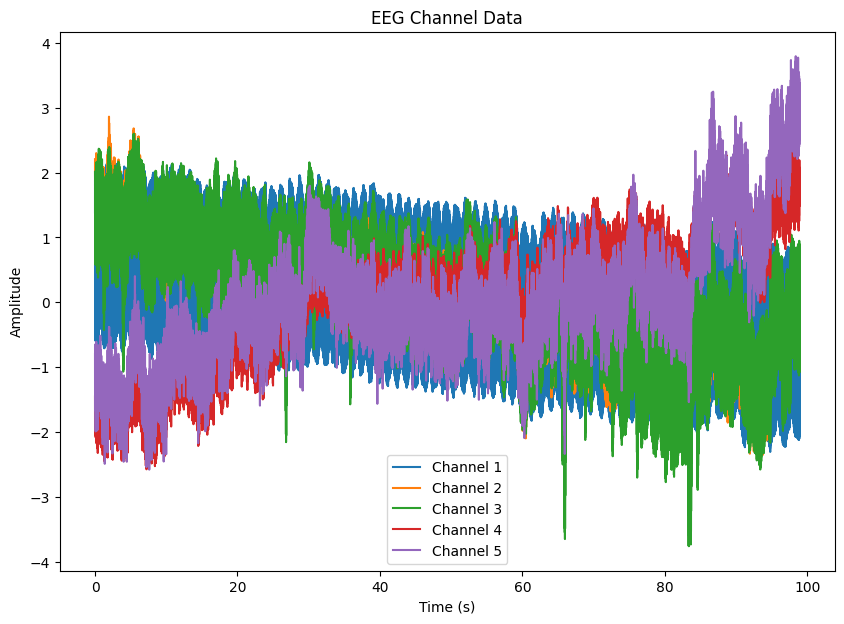

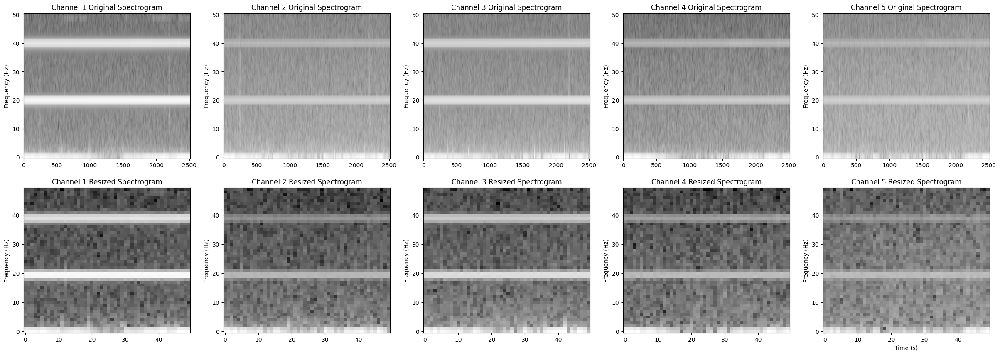

In [37]:
import csv
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import zoom
from numpy.fft import fft

# Load CSV data
with open('../EEG_Recordings/Recordings2/BrainFlow-RAW_Recordings2_0.csv', 'r') as file:
    csv_reader = csv.reader(file, delimiter='\t')
    csv_data = list(csv_reader)

print(csv_data)

# Skip the header row if it exists
header = csv_data[0]
csv_data = csv_data[1:]

# Convert CSV data to numpy array
data = np.array(csv_data).astype(float)

# Select columns 3, 4, 6, 7, and 8
selected_columns = data[:, [3, 4, 6, 7, 8]]

# Cut the first 5000 timesteps
selected_columns = selected_columns[5000:]

# Normalize each channel (mean = 0, std = 1)
epsilon = 1e-10  # Small value to avoid division by zero
for i in range(selected_columns.shape[1]):
    mean = np.mean(selected_columns[:, i])
    std = np.std(selected_columns[:, i]) + epsilon
    selected_columns[:, i] = (selected_columns[:, i] - mean) / std

# Create a time vector based on the sampling rate
sampling_rate = 255  # Hz
num_samples = selected_columns.shape[0]
time_vector = np.arange(num_samples) / sampling_rate

# Plot the selected data
plt.figure(figsize=(10, 7))
for i in range(selected_columns.shape[1]):
    plt.plot(time_vector, selected_columns[:, i], label='Channel ' + str(i + 1))

plt.legend()
plt.title('EEG Channel Data')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.show()

# Generate spectrograms for each channel
spectrograms = []
resized_spectrograms = []

for i in range(selected_columns.shape[1]):
    # Parameters for the STFT
    NFFT = 100
    noverlap = 90
    step = NFFT - noverlap
    window = np.hanning(NFFT)
    segments = []

    # Segment the data and apply window
    for start in range(0, len(selected_columns[:, i]) - NFFT + 1, step):
        segment = selected_columns[:, i][start:start + NFFT]
        windowed_segment = segment * window
        segments.append(windowed_segment)

    # Compute FFT for each segment and store power spectral density
    Pxx = [np.abs(fft(seg)[:NFFT // 2 + 1])**2 for seg in segments]  # Use only the first half
    Pxx = np.array(Pxx).T  # Transpose to align time and frequency correctly

    # Apply 10 * log10 transformation
    Pxx = 10 * np.log10(Pxx + epsilon)  # Add epsilon to avoid log(0)

    # Resize the spectrogram to 50x50 using bicubic interpolation
    Pxx_resized = zoom(Pxx, (50 / Pxx.shape[0], 50 / Pxx.shape[1]), order=3)

    # Store the original and resized spectrograms
    spectrograms.append(Pxx)
    resized_spectrograms.append(Pxx_resized)

# Create a figure with subplots for original and resized spectrograms
fig, axs = plt.subplots(2, selected_columns.shape[1], figsize=(30, 10))  # Adjust size as needed

for i in range(selected_columns.shape[1]):
    # Plot original spectrogram
    ax_original = axs[0, i] if selected_columns.shape[1] > 1 else axs[0]
    img_original = ax_original.imshow(spectrograms[i], aspect='auto', cmap='gray', origin='lower')
    ax_original.set_title(f'Channel {i + 1} Original Spectrogram')
    ax_original.set_ylabel('Frequency (Hz)')
    
    # Plot resized spectrogram
    ax_resized = axs[1, i] if selected_columns.shape[1] > 1 else axs[1]
    img_resized = ax_resized.imshow(resized_spectrograms[i], aspect='auto', cmap='gray', origin='lower')
    ax_resized.set_title(f'Channel {i + 1} Resized Spectrogram')
    ax_resized.set_ylabel('Frequency (Hz)')

# Add a common x-label
plt.xlabel('Time (s)')
plt.show()